In [59]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

Take a photo from webcam

<IPython.core.display.Javascript object>

Saved to photo.jpg


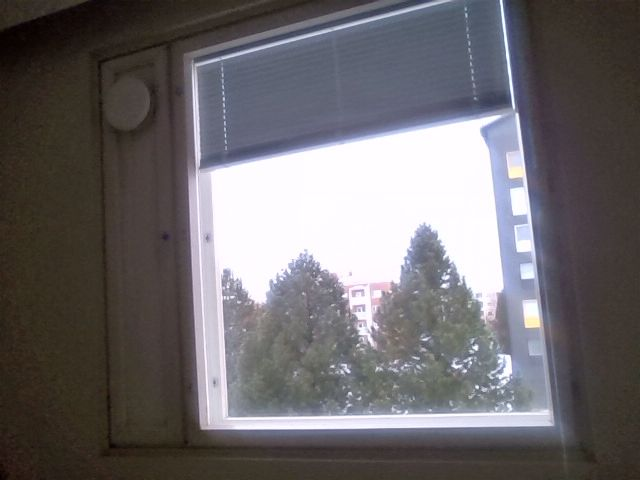

In [60]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

Convert into Black and White Photo

In [61]:
# load the Pillow -module
from PIL import Image

# open the original photo, and convert it to black and white (convert -> L)
img = Image.open("/content/DeOldify/photo.jpg").convert('L')

# save the new photo somewhere, in this case, content-folder
img.save('greyscale.png')

In [62]:
!git clone https://github.com/jantic/DeOldify.git DeOldify

Cloning into 'DeOldify'...
remote: Enumerating objects: 2609, done.
remote: Counting objects: 100% (263/263), done.
remote: Compressing objects: 100% (186/186), done.
remote: Total 2609 (delta 87), reused 209 (delta 70), pack-reused 2346
Receiving objects: 100% (2609/2609), 69.71 MiB | 25.09 MiB/s, done.
Resolving deltas: 100% (1170/1170), done.


In [63]:
cd DeOldify

/content/DeOldify/DeOldify


In [64]:
from deoldify import device
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU7)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

GPU not available.


In [65]:
!pip install -r requirements-colab.txt

In [66]:
import fastai
from deoldify.visualize import *
import warnings
warnings.filterwarnings("ignore", category=UserWarning, message=".*?Your .*? set is empty.*?")

In [67]:
!mkdir 'models'
!wget https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth -O ./models/ColorizeArtistic_gen.pth

mkdir: cannot create directory ‘models’: File exists
--2024-04-10 13:05:33--  https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth
Resolving data.deepai.org (data.deepai.org)... 185.93.1.243, 2400:52e0:1a00::894:1
Connecting to data.deepai.org (data.deepai.org)|185.93.1.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 255144681 (243M) [application/octet-stream]
Saving to: ‘./models/ColorizeArtistic_gen.pth’

./models/ColorizeAr 100%[===================>] 243.32M  4.95MB/s    in 50s     

2024-04-10 13:06:23 (4.91 MB/s) - ‘./models/ColorizeArtistic_gen.pth’ saved [255144681/255144681]



In [68]:
colorizer = get_image_colorizer(artistic=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can als

Colorize the converted photo

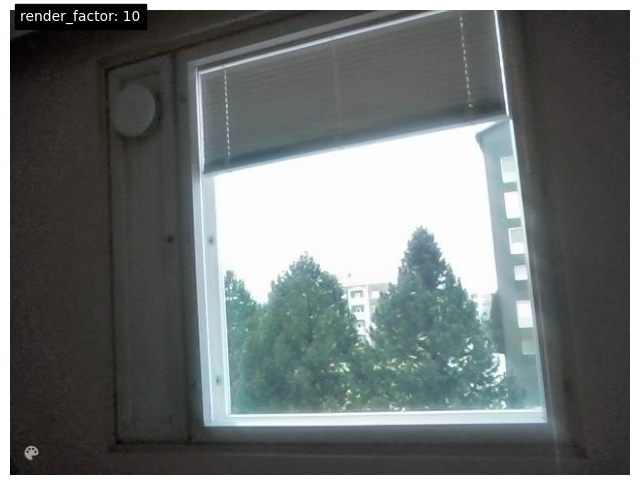

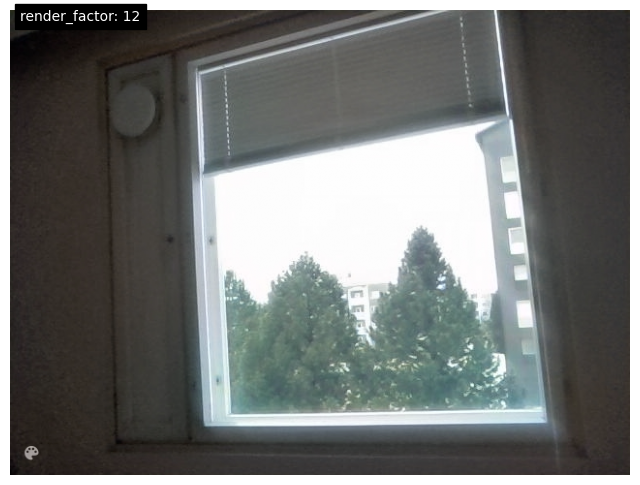

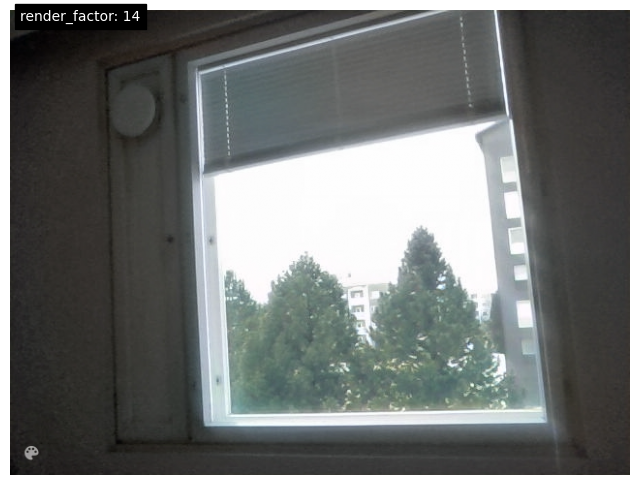

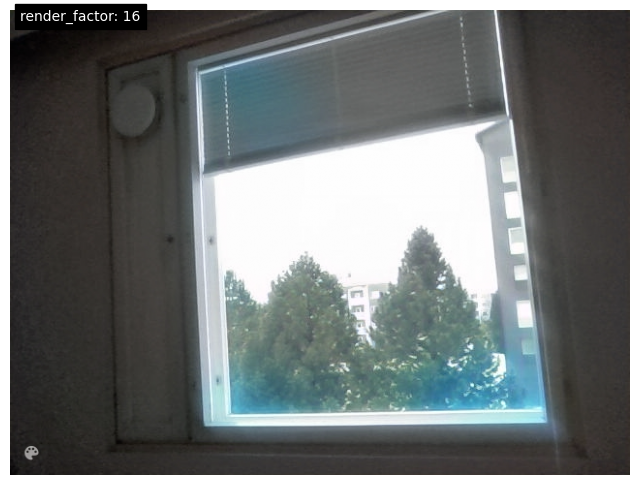

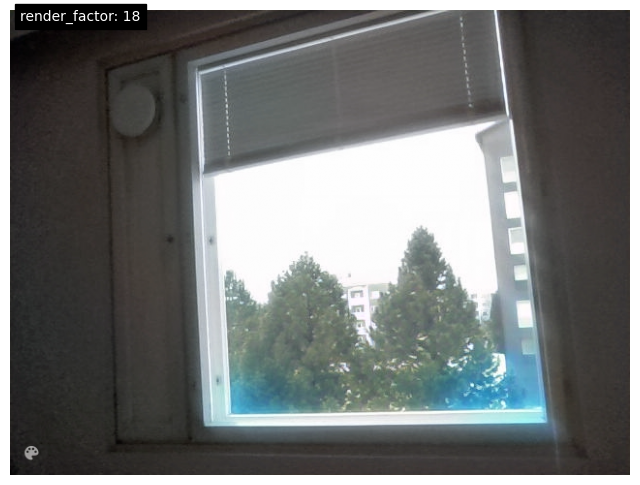

...

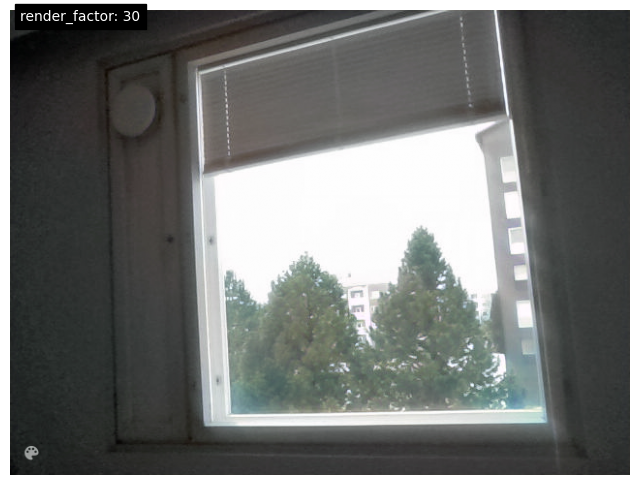

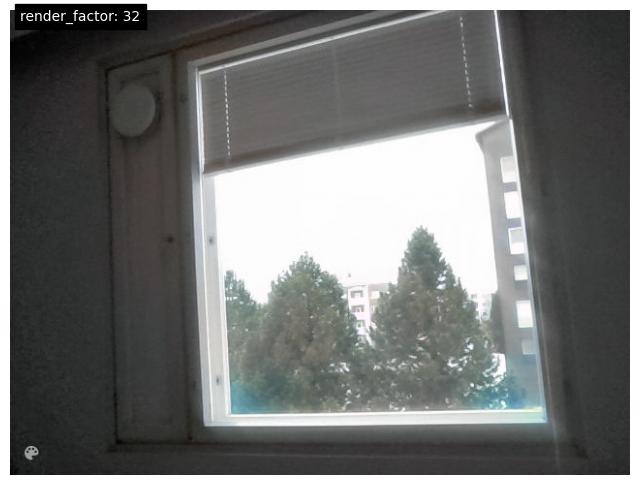

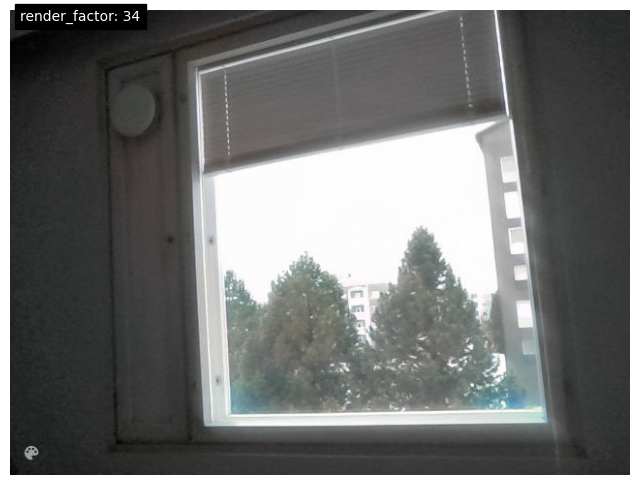

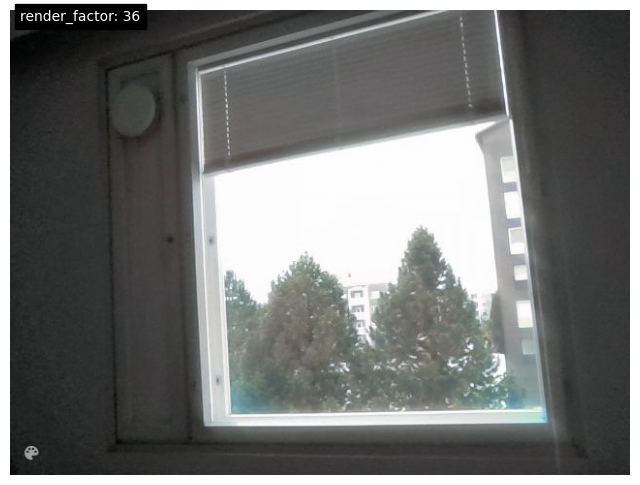

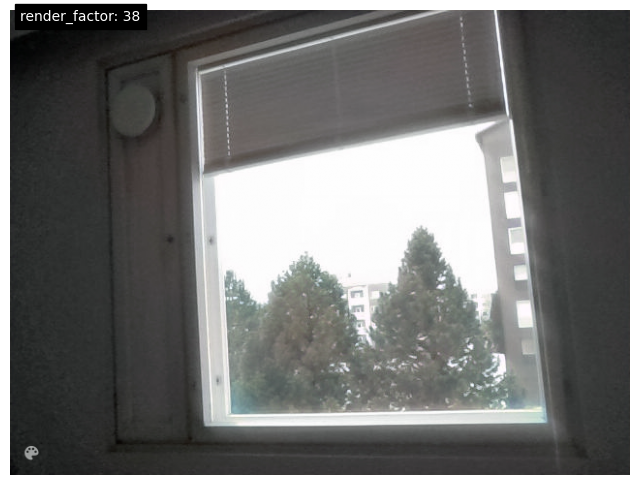

In [69]:
for i in range(10,40,2):
    colorizer.plot_transformed_image('../greyscale.png', render_factor=i, display_render_factor=True, figsize=(8,8))

In [71]:
!pip install bing-image-downloader

Download 20 images from internet

In [72]:
from bing_image_downloader import downloader
downloader.download("bw landscape", limit=20,  output_dir='dataset', adult_filter_off=True, force_replace=False, timeout=60, verbose=True)

[%] Downloading Images to /content/DeOldify/DeOldify/dataset/bw landscape


[!!]Indexing page: 1

[%] Indexed 20 Images on Page 1.


[%] Downloading Image #1 from https://www.wallpaperbetter.com/wallpaper/620/587/718/lake-bw-mountains-landscape-hd-2K-wallpaper.jpg
[%] File Downloaded !

[%] Downloading Image #2 from http://www.wallpaperbetter.com/wallpaper/447/53/127/mountains-landscape-river-snow-winter-bw-rocks-stones-forest-trees-hd-1080P-wallpaper.jpg
[%] File Downloaded !

[%] Downloading Image #3 from https://www.wallpaperbetter.com/wallpaper/908/931/714/bw-landscape-clouds-hd-1080P-wallpaper.jpg
[%] File Downloaded !

[%] Downloading Image #4 from https://www.viewbug.com/media/mediafiles/2016/06/10/66542858_large1300.jpg
[Error]Invalid image, not saving https://www.viewbug.com/media/mediafiles/2016/06/10/66542858_large1300.jpg

[!] Issue getting: https://www.viewbug.com/media/mediafiles/2016/06/10/66542858_large1300.jpg
[!] Error:: Invalid image, not saving https://www.viewbug.c

Colorize the downloaded images

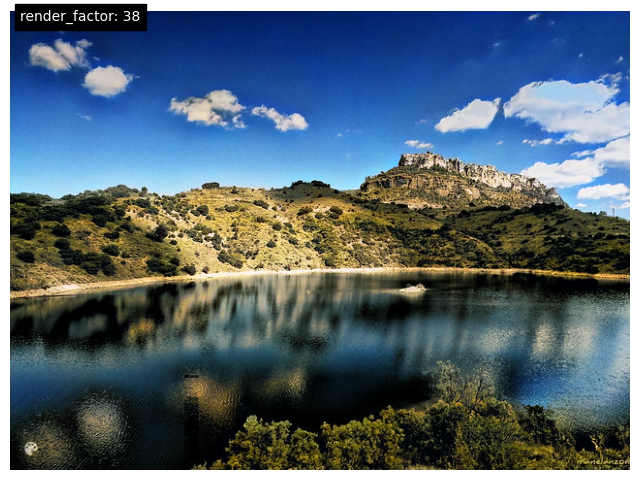

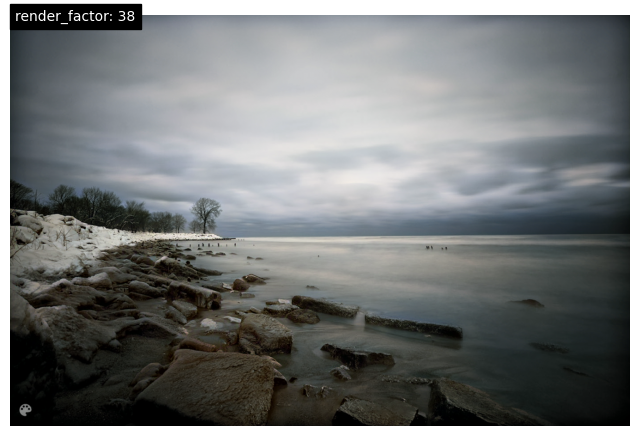

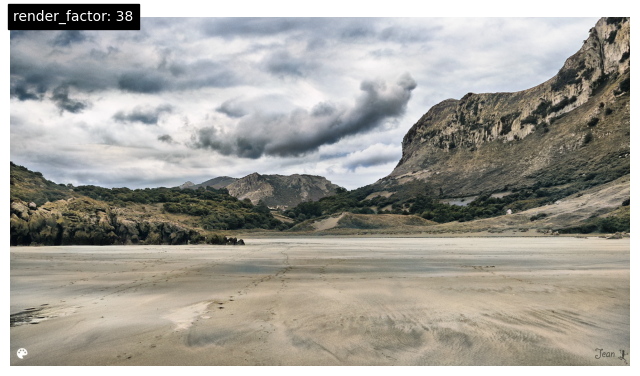

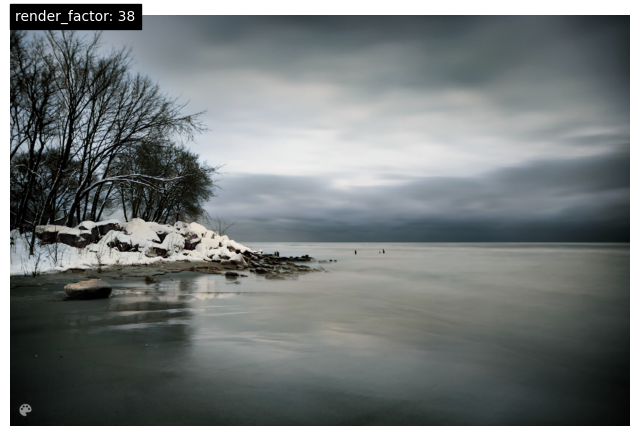

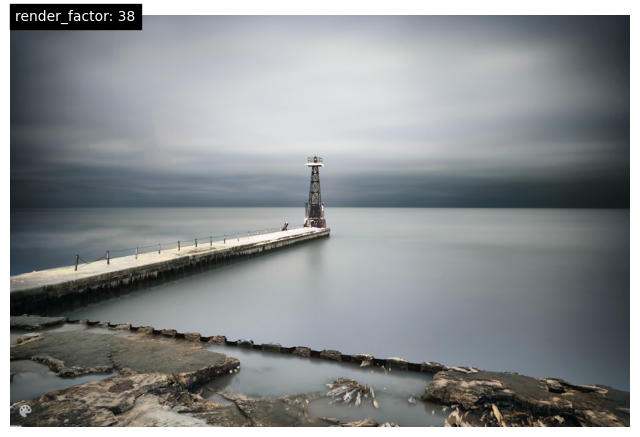

...

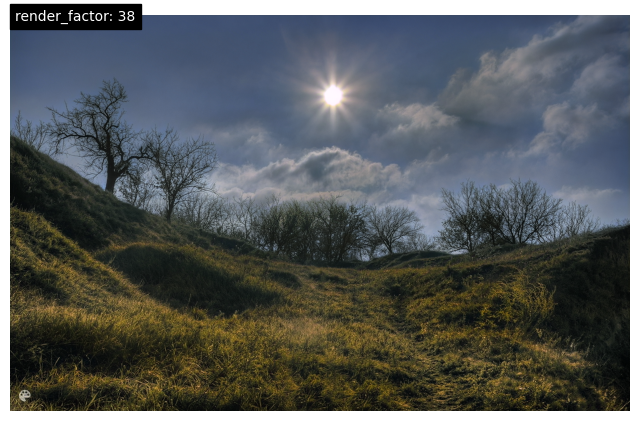

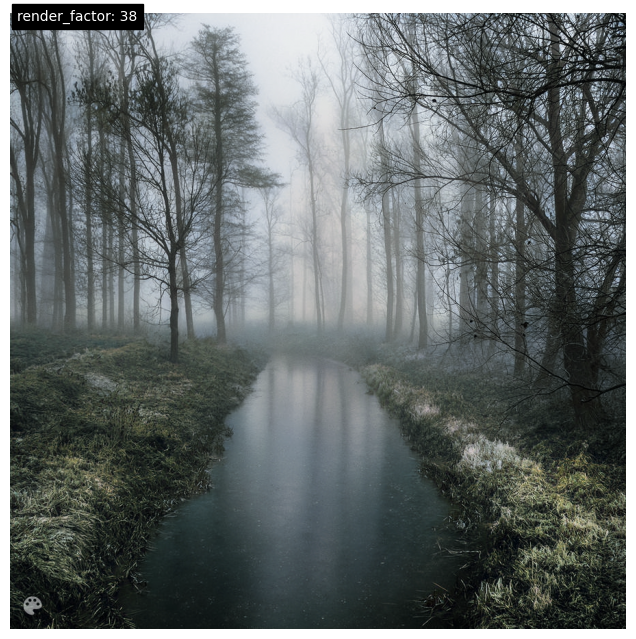

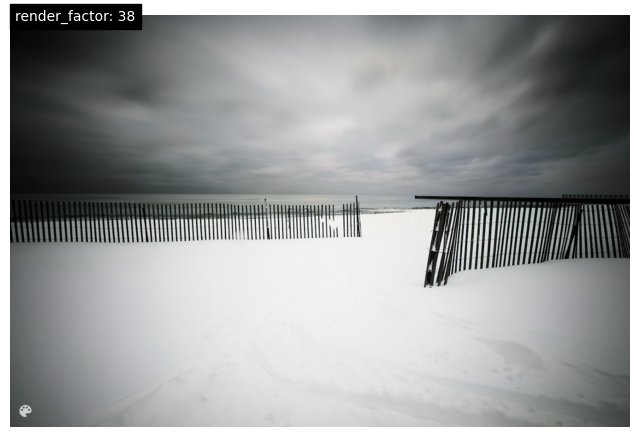

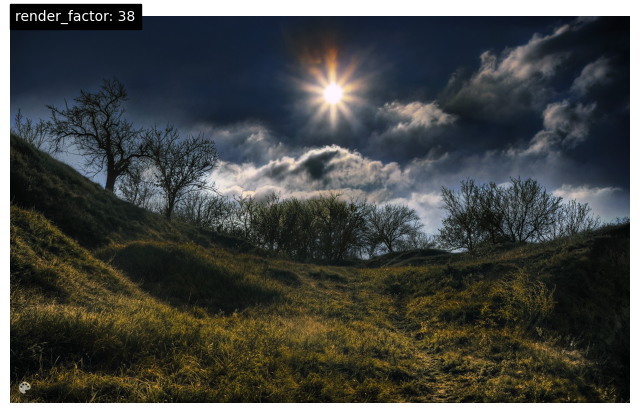

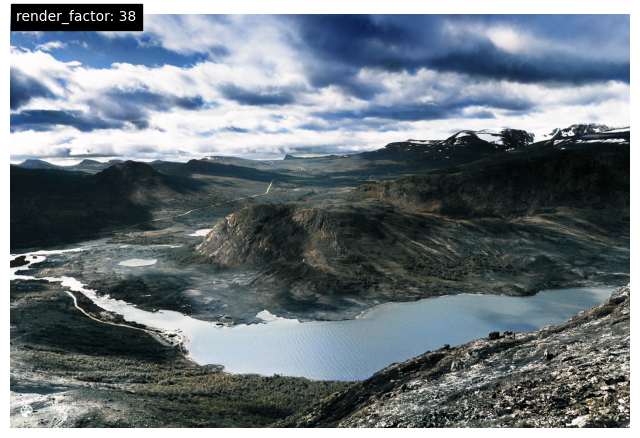

In [73]:
# import required module
import os
# assign directory
directory = "../DeOldify/dataset/bw landscape/"

for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
        colorizer.plot_transformed_image(f, render_factor=i, display_render_factor=True, figsize=(8,8))